# ОБРОБКА ЗОБРАЖЕНЬ ТА РОБОТА З НАБОРАМИ ФАЙЛІВ ЦИФРОВИХ ЗОБРАЖЕНЬ

## Мета: Отримати знання та навички обробки цифрових зображень використовуючи бібліотеки Pillow та/або OpenCV та роботи з обробленням набору зображень

## Завдання 1

### Опис виконаного завдання

Було створено Python-скрипт для аналізу та обробки зображень у вказаній директорії. Основна функція скрипту `get_image_info(folder_path)` отримує інформацію про всі зображення у заданій папці, обробляє їх та створює зведену таблицю із відповідними даними.

### Реалізовано наступні кроки:
1. **Імпорт необхідних бібліотек**:
   - `os` і `glob` для навігації по файловій системі.
   - `PIL` (бібліотека Pillow) для обробки зображень, включно з підтримкою AVIF-формату через плагін `pillow_avif`.
   - `pandas` для створення таблиці з даними.
   - `base64` і `BytesIO` для створення мініатюр та зберігання їх у форматі Base64 для подальшого відображення в HTML.
   - `IPython.display.HTML` для відображення таблиці в Jupyter Notebook.

2. **Обробка зображень**:
   - Сканування папки та фільтрація файлів за розширеннями зображень: `.png`, `.jpg`, `.jpeg`, `.jfif`, `.avif`.
   - Для кожного зображення:
     - Отримано основну інформацію, включно з **назвою файлу**, **колірною моделлю**, **форматом**, **кількістю каналів**, **розміром у мегабайтах**, **шириною** та **висотою** зображення.
     - Створено мініатюру зображення розміром `100x100` пікселів та закодовано її в форматі Base64 для вбудованого відображення у HTML.

3. **Результуюча таблиця**:
   - Таблиця містить такі колонки:
     - **name**: Назва файлу зображення.
     - **color model**: Колірна модель (наприклад, RGB або Grayscale).
     - **format**: Формат зображення (JPEG, PNG, AVIF тощо).
     - **channels**: Кількість кольорових каналів.
     - **size (MB)**: Розмір зображення в мегабайтах.
     - **width**: Ширина зображення в пікселях.
     - **height**: Висота зображення в пікселях.
     - **full path**: Повний шлях до файлу.
     - **image**: Мініатюра зображення у форматі Base64, вбудована у HTML для зручного перегляду.

4. **Відображення таблиці в Jupyter Notebook**:
   - За допомогою `HTML(df.to_html(escape=False))` таблиця відображається без екранування HTML, що дозволяє показувати мініатюри зображень у вигляді HTML-елементів `<img>`.

### Результат
Цей скрипт дозволяє швидко зібрати та проаналізувати основну інформацію про зображення у папці, включно з попереднім переглядом кожного зображення у вигляді мініатюр. Це корисно для візуальної інспекції зображень та отримання їх основних характеристик у структурованому форматі.


,name,color model,format,channels,size (MB),width,height,full path,image
0,Best-of-2016-Nasim-Mansurov-28.jpg,RGB,JPEG,3,1.15,2048,1365,photos_and_files\Best-of-2016-Nasim-Mansurov-28.jpg,
1,husky-puppy-among-clouds-pink-jpg_2450518_wh1200.png,RGB,PNG,3,0.76,1200,673,photos_and_files\husky-puppy-among-clouds-pink-jpg_2450518_wh1200.png,
2,images (1).jfif,RGB,JPEG,3,0.01,275,183,photos_and_files\images (1).jfif,
3,images (2).jfif,RGB,JPEG,3,0.01,300,168,photos_and_files\images (2).jfif,
4,images (3).jfif,RGB,JPEG,3,0.01,275,183,photos_and_files\images (3).jfif,
5,images.jfif,RGB,JPEG,3,0.01,275,183,photos_and_files\images.jfif,
6,Lake_mapourika_NZ.jpeg,RGB,JPEG,3,0.50,2048,1536,photos_and_files\Lake_mapourika_NZ.jpeg,
7,octavio-fossatti-3fy1RanqtLQ-unsplash.jpg,RGB,JPEG,3,7.93,6912,9216,photos_and_files\octavio-fossatti-3fy1RanqtLQ-unsplash.jpg,
8,premium_photo-1666672388644-2d99f3feb9f1.jfif,RGB,JPEG,3,0.99,3000,2000,photos_and_files\premium_photo-1666672388644-2d99f3feb9f1.jfif,
9,premium_photo-1669839774885-b1958e625b5e.avif,RGB,AVIF,3,0.03,500,334,photos_and_files\premium_photo-1669839774885-b1958e625b5e.avif,

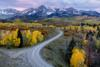
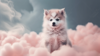
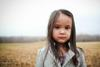
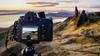
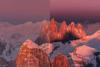
...
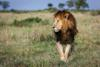
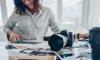
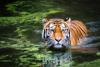
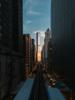
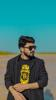

In [1]:
import os
import glob
from PIL import Image, UnidentifiedImageError
import pandas as pd
from IPython.display import HTML
from io import BytesIO
import base64

# Імпорт плагіна для підтримки AVIF
import pillow_avif

def get_image_info(folder_path):
    image_data = []
    files = glob.glob(os.path.join(folder_path, '*'))

    for file_path in files:
        try:
            # Розширення, які хочемо обробляти
            if not file_path.lower().endswith(('.png', '.jpg', '.jpeg', '.jfif', '.avif')):
                continue  # Пропускаємо файли, які не є зображеннями
            
            with Image.open(file_path) as img:
                file_name = os.path.basename(file_path)
                color_model = img.mode
                format_ = img.format
                channels = len(img.getbands())
                size_mb = round(os.path.getsize(file_path) / (1024 * 1024), 2)
                width, height = img.size
                
                # Створення мініатюри
                thumbnail = img.copy()
                thumbnail.thumbnail((100, 100))
                img_byte_arr = BytesIO()
                thumbnail.save(img_byte_arr, format=img.format)
                img_base64 = base64.b64encode(img_byte_arr.getvalue()).decode('utf-8')
                img_thumbnail = f'<img src="data:image/{format_.lower()};base64,{img_base64}" />'
                
                image_data.append({
                    "name": file_name,
                    "color model": color_model,
                    "format": format_,
                    "channels": channels,
                    "size (MB)": size_mb,
                    "width": width,
                    "height": height,
                    "full path": file_path,
                    "image": img_thumbnail
                })
        except (UnidentifiedImageError, OSError):
            # Якщо файл не є зображенням або виникла інша помилка, пропускаємо його
            continue

    return pd.DataFrame(image_data)

# Приклад використання
folder_path = "photos_and_files/"  # Вкажіть правильний шлях до папки з зображеннями
df = get_image_info(folder_path)

# Відображення в Jupyter Notebook з мініатюрами
HTML(df.to_html(escape=False))


## Завдання 2

### Опис виконаного завдання

Було створено Python-скрипт для автоматичного генерування постера з випадковими зображеннями із заданої папки. Постер складається з мозаїки квадратних зображень із застосуванням випадкових кольорових фільтрів.

### Реалізовано наступні кроки:

1. **Функція `crop_to_square(img)`**:
   - Обрізає зображення до квадратної форми, зберігаючи центральну частину.
   - Це забезпечує однаковий формат всіх зображень, що полегшує їх розташування на постері.

2. **Функція `apply_random_filter(img)`**:
   - Застосовує випадковий кольоровий фільтр до зображення:
     - Підсилення кольору.
     - Блакитний, червоний, зелений або жовтий відтінки на основі монохромного зображення.
   - Фільтри дозволяють створити унікальний вигляд постера із різними відтінками зображень.

3. **Функція `create_poster(folder_path, output_name, rows, columns, output_size=(500, 500))`**:
   - Створює постер із зображень у зазначеній папці.
   - **Параметри**:
     - `folder_path`: шлях до папки з зображеннями.
     - `output_name`: ім'я вихідного файлу постера.
     - `rows`, `columns`: кількість рядків і стовпчиків у постері.
     - `output_size`: розмір кожного зображення на постері (за замовчуванням `500x500` пікселів).
   - **Процес**:
     - Вибір випадкового зображення із папки.
     - Обрізання зображення до квадрату, зміна його розміру та застосування випадкового фільтра.
     - Вставка зображення у відповідну позицію на постері.
   - **Зберігання**:
     - Зберігає постер із зазначеним ім'ям файлу та відображає його.

4. **Приклад використання**:
   - Використовується для генерації трьох варіантів постерів з випадковими розмірами мозаїки (кількістю рядків і стовпчиків).
   - Розмір мозаїки обирається випадково в межах від 2 до 5 рядків і стовпців.

### Результат
Скрипт автоматично створює постери у форматі мозаїки, де кожен квадрат має випадковий кольоровий фільтр. Це дозволяє швидко створювати унікальні постери із наявних зображень, що може бути корисно для візуальної презентації або оформлення. Кожен постер зберігається у файл з унікальною назвою.


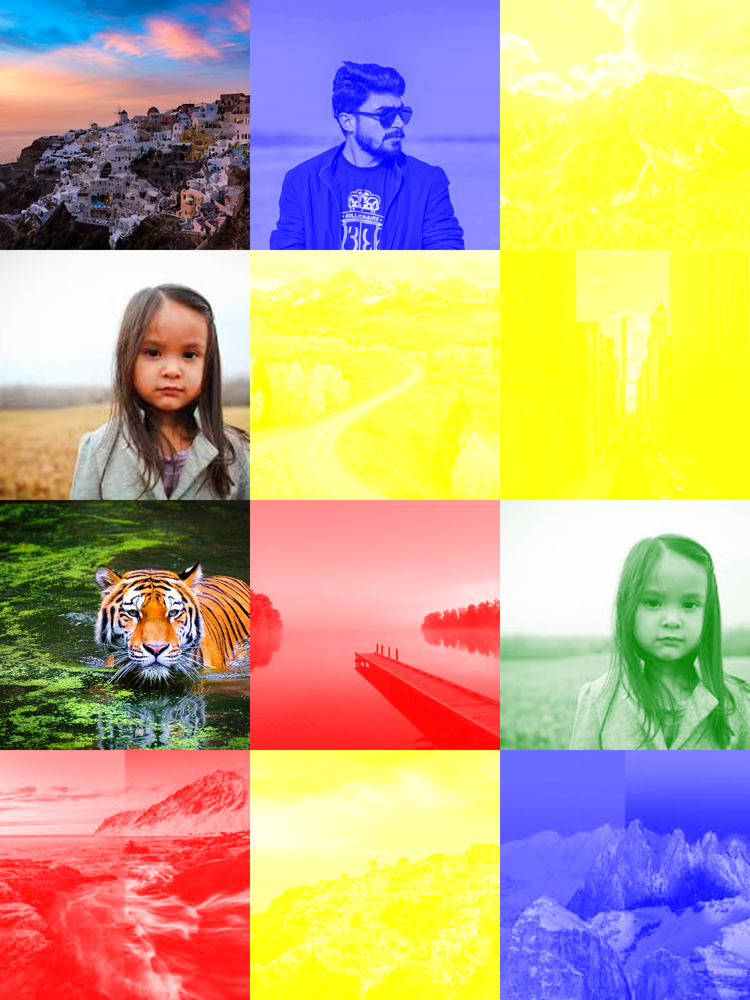

Постер збережено як poster_variant_1_4x3.jpg


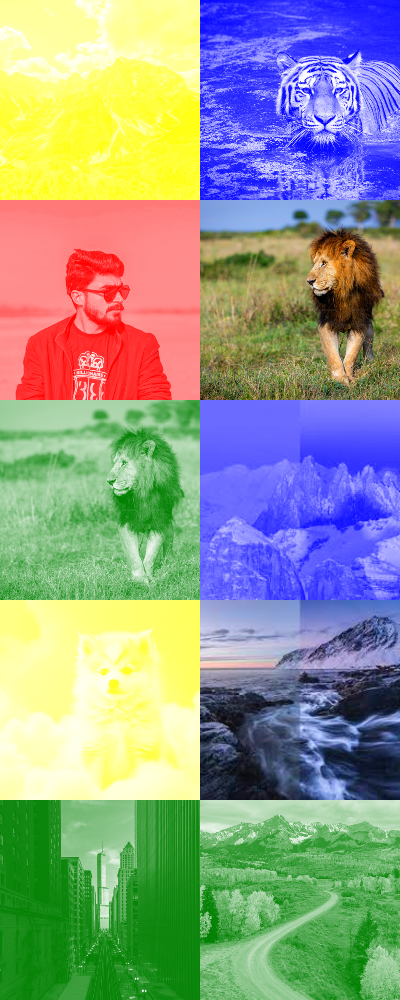

Постер збережено як poster_variant_2_5x2.jpg


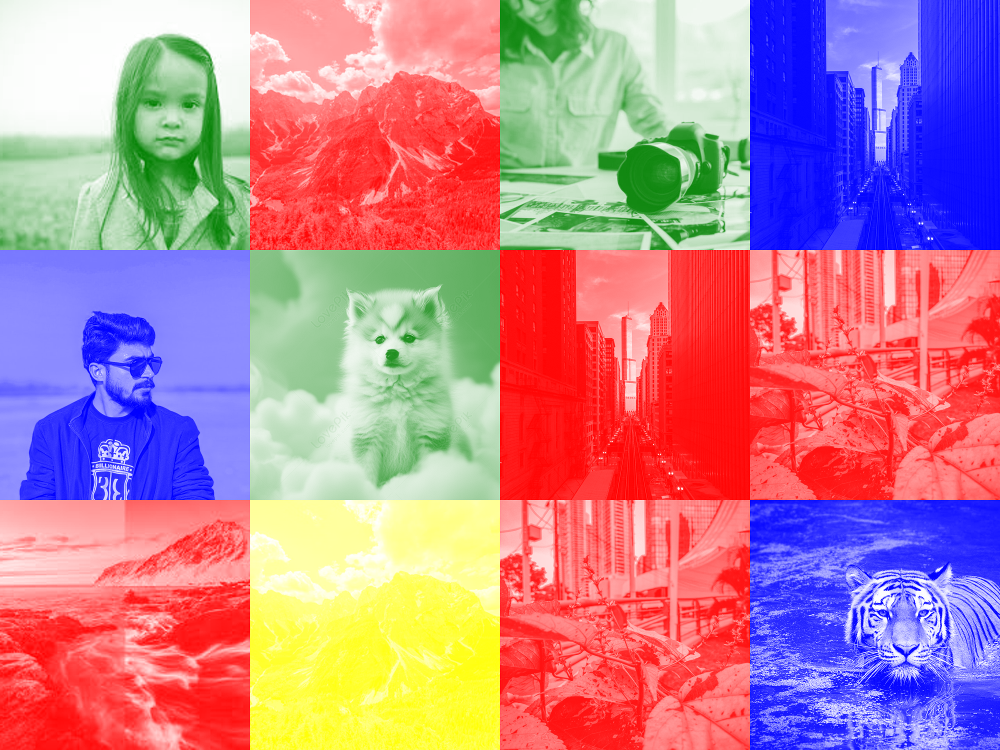

Постер збережено як poster_variant_3_3x4.jpg


In [4]:
import random
from PIL import Image, ImageOps, ImageEnhance

def crop_to_square(img):
    # Обрізаємо зображення до квадрату від центру
    width, height = img.size
    min_side = min(width, height)
    left = (width - min_side) / 2
    top = (height - min_side) / 2
    right = (width + min_side) / 2
    bottom = (height + min_side) / 2
    img = img.crop((left, top, right, bottom))
    return img

def apply_random_filter(img):
    # Випадковий вибір кольорового фільтру
    filters = [
        ImageEnhance.Color(img).enhance(1.5),  # Підсилення кольору
        ImageOps.colorize(img.convert("L"), black="blue", white="white"),  # Блакитний фільтр
        ImageOps.colorize(img.convert("L"), black="red", white="white"),  # Червоний фільтр
        ImageOps.colorize(img.convert("L"), black="green", white="white"),  # Зелений фільтр
        ImageOps.colorize(img.convert("L"), black="yellow", white="white"),  # Жовтий фільтр
    ]
    return random.choice(filters)

def create_poster(folder_path, output_name, rows, columns, output_size=(500, 500)):
    # Отримуємо список всіх зображень у папці
    images = glob.glob(os.path.join(folder_path, "*"))
    images = [img for img in images if img.lower().endswith(('.png', '.jpg', '.jpeg', '.jfif', '.avif'))]
    
    # Створюємо порожнє полотно для постера
    poster_width = output_size[0] * columns
    poster_height = output_size[1] * rows
    poster = Image.new("RGB", (poster_width, poster_height))

    for i in range(rows):
        for j in range(columns):
            # Випадковий вибір зображення
            img_path = random.choice(images)
            with Image.open(img_path) as img:
                # Обрізаємо до квадрату, змінюємо розмір та застосовуємо фільтр
                img = crop_to_square(img)
                img = img.resize(output_size)
                img = apply_random_filter(img)
                
                # Вставляємо зображення в постер
                x = j * output_size[0]
                y = i * output_size[1]
                poster.paste(img, (x, y))
    
    # Зберігаємо постер
    poster.save(output_name)
    display(poster)
    print(f"Постер збережено як {output_name}")

# Приклад використання
folder_path = "photos_and_files/"  # Задайте шлях до папки з зображеннями

# Генеруємо постери з різною кількістю рядків і стовпчиків
for i in range(1, 4):
    rows = random.randint(2, 5)  # Випадкова кількість рядків від 2 до 5
    columns = random.randint(2, 5)  # Випадкова кількість стовпчиків від 2 до 5
    output_name = f"poster_variant_{i}_{rows}x{columns}.jpg"
    create_poster(folder_path, output_name, rows, columns, output_size=(500, 500))
